# FOTS: Fast Oriented Text Spotting with a Unified Network

### Imports

In [21]:
import wget
import zipfile
import os
import re
import shutil
import cv2
import json
import scipy.io
import random
import pickle
from statistics import mean
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import matplotlib.patches as patches
from tqdm import tqdm

### Download data

In [4]:
wget.download("https://thor.robots.ox.ac.uk/~vgg/data/scenetext/SynthText.zip")

100% [..................................................................] 40717671794 / 40717671794

'SynthText.zip'

In [5]:
wget.download("https://rrc.cvc.uab.es/downloads/ch4_training_images.zip")

100% [........................................................................] 90667586 / 90667586

'ch4_training_images.zip'

In [6]:
wget.download("https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip")

100% [............................................................................] 344624 / 344624

'ch4_training_localization_transcription_gt.zip'

## Extract data and EDA

### EDA for SynthText dataset images

**Check folder structure**

In [146]:
print('Total number of folders: {}'.format(len([int(i) for i in os.listdir('SynthText') if i.isnumeric()])))

Total number of folders: 200


In [147]:
avg_file_count = 0
for i in range(1,201):
    avg_file_count = avg_file_count + len(os.listdir('SynthText/' + str(i)))
print('Average number of images: {}'.format(avg_file_count/200))    

Average number of images: 4293.84


Total we have 200 folders and an average 4293 number of files in this dataset. So for EDA, we can use a 25 random subset of folders .

**Get sampled images for EDA**

In [148]:
# Sample folders
folder_indices = random.sample(range(1,201), 10)

In [149]:
def getFilePath(root, sample = None):
    """This function takes a root directory as input and gives all/sampled the file paths """
    files = []
    for res in os.walk(root,topdown=True):
        img_files = random.sample(res[2], int(len(res[2]) * sample)) if sample is not None else res[2]
        for file in img_files:
            files.append(res[0] + '/' + file)
    return files    

In [150]:
# Collect sampled file paths for each folder
image_paths = []
for f in folder_indices:
    image_paths.extend(getFilePath('SynthText/' + str(f), 0.25))
random.shuffle(image_paths)
print('Total sampled images: ', len(image_paths))

Total sampled images:  10676


Now we have total 250 images on which we can perform EDA.

In [151]:
def show_images(image_paths):
    """Given a set of image file paths, it displays the images in grid manner."""
    no_images = len(image_paths)
    f, ax = plt.subplots(int(no_images/2), 2, figsize=(20, 5*no_images))
    ax = ax.flatten()

    for i in range(no_images):
        image = cv2.imread(image_paths[i], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(15,15))
        ax[i].imshow(image)

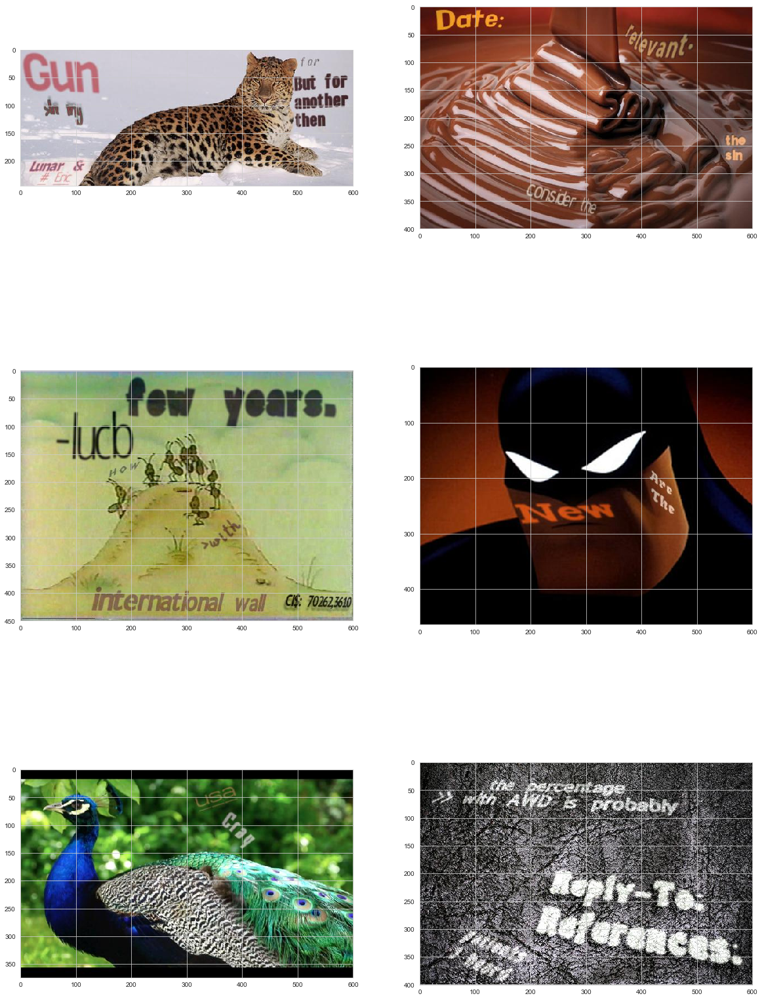

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [152]:
show_images(image_paths[0:6])

As we can see, different texts have been patched on top of these images and we need to spot those texts with bounding boxes. 

**Check distributions of image height and width**

In [153]:
def getImageShape(img_paths):
    """Given an image paths, it extracts the images and returns their height and width"""
    h_w = []
    for img in img_paths:
        image = cv2.imread(img,cv2.COLOR_BGR2RGB)
        w, h,_=image.shape
        h_w.append((h,w))
    return h_w

In [154]:
img_df = pd.DataFrame(getImageShape(image_paths), columns =['Height', 'Width'])
img_df.head()

,Height,Width
0,600,245
1,600,400
2,600,450
3,600,464
4,600,375


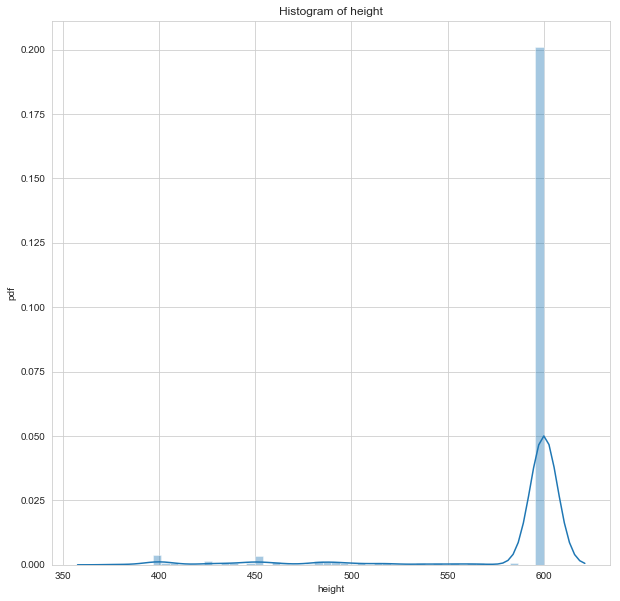

In [155]:
#PDF for image height
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(img_df['Height'].values)
plt.title("Histogram of height")
plt.xlabel("height")
plt.ylabel("pdf")
plt.show()

From the plot, we can see most of the images has heights approximately in between 580 and 630. There are few images having heights in between 390 and 420.

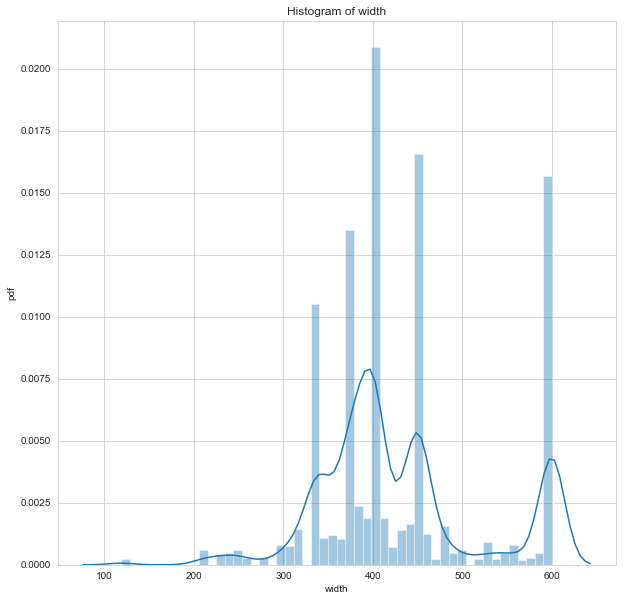

In [156]:
#PDF for image width
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(img_df['Width'].values)
plt.title("Histogram of width")
plt.xlabel("width")
plt.ylabel("pdf")
plt.show()

From the plot, we can see most of the images has heights in between 300 and 500. There are some images having heights in between 550 and 630.

So we can resize the image to (512,512,3). (3- for rgb channels)

### EDA for SynthText dataset bounding boxes

In [157]:
#Get bounding box and text information
bbox_txt_info = scipy.io.loadmat('SynthText/gt.mat')
bbox_txt_info.keys()

dict_keys(['__header__', '__version__', '__globals__', 'charBB', 'wordBB', 'imnames', 'txt'])

In this problem, we are mainly focusing on the word level bounding box. So we will use wordBB, imnames and txt.

In [158]:
data_dict = dict()

**Check for 'imnames'**

In [159]:
print('innames shape', bbox_txt_info['imnames'][0].shape)
bbox_txt_info['imnames'][0][0][0]

innames shape (858750,)


'8/ballet_106_0.jpg'

This is actual path for the 1st image. We need to unwrap the imnames and add 'SynthText/' to each image path. 

In [160]:
imnames = ['SynthText/' + bbox_txt_info['imnames'][0][i][0] for i in range(bbox_txt_info['imnames'][0].shape[0])]
print('Sample img path: ', imnames[0])
data_dict['imname'] = imnames

Sample img path:  SynthText/8/ballet_106_0.jpg


**Check for 'wordBB'**

In [161]:
print('wordBB shape', bbox_txt_info['imnames'][0].shape)
bbox_txt_info['wordBB'][0][0].shape

wordBB shape (858750,)


(2, 4, 15)

Bounding box value for each image has shape (2,4,bbox_count), where the 1st dim represents whether the value is for X-axis or Y-axis. The 2nd dim represents 4 values coresponing to each vertex of the bounding box (As in normal cases, bounding boxes are rectangle in shape). Now the 3rd dim represents the values coresponding to all the bounding boxes present in a image, where the shape differs if number of bounding boxes changes from image to image.

In [162]:
bboxes = [bbox_txt_info['wordBB'][0][i] if bbox_txt_info['wordBB'][0][i].ndim == 3 
          else np.expand_dims(bbox_txt_info['wordBB'][0][i], axis=-1)
          for i in range(bbox_txt_info['wordBB'][0].shape[0])]
print('Sample bounding box shape for an image', bboxes[0].shape)
data_dict['wordBB'] = bboxes

Sample bounding box shape for an image (2, 4, 15)


**Check for 'txt'**

In [163]:
print('txt shape', bbox_txt_info['txt'][0].shape)
print('txt data shape: ', bbox_txt_info['txt'][0][0].shape)
print('txt in 1st image: ', bbox_txt_info['txt'][0][0])

txt shape (858750,)
txt data shape:  (8,)
txt in 1st image:  ['Lines:\nI lost\nKevin ' 'will                ' 'line\nand            '
 'and\nthe             ' '(and                ' 'the\nout             '
 'you                 ' "don't\n pkg          "]


In the 1st image, it has 8 texts as shown below.

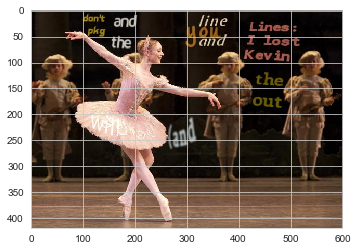

In [164]:
path = imnames[0]
txt = len(bbox_txt_info['txt'][0][0])
image = cv2.imread(path, cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
imgplot = plt.imshow(image)
plt.show()

In [165]:
txts = [bbox_txt_info['txt'][0][i] for i in range(bbox_txt_info['txt'][0].shape[0])]
print('Sample bounding box shape for an image', txts[0].shape)
data_dict['txt'] = txts

Sample bounding box shape for an image (8,)


In [166]:
synth_data = pd.DataFrame(data_dict)
synth_data.head()

,imname,wordBB,txt
0,SynthText/8/ballet_106_0.jpg,"[[[420.58957, 418.85016, 448.08478, 410.3094, ...","[Lines:\nI lost\nKevin , will ,..."
1,SynthText/8/ballet_106_1.jpg,"[[[255.28821, 424.29144, 419.3614, 416.88367, ...","[with , Sender:\nBNR-..."
2,SynthText/8/ballet_106_10.jpg,"[[[322.5814, 432.39447, 163.69196, 125.584595,...","[Fern , Mutch,, void , his , loony , it's ..."
3,SynthText/8/ballet_106_100.jpg,"[[[257.37372, 428.30585, 422.95227, 79.92147, ...","[Re: , reins\nneck , War\nfor\nthe, new..."
4,SynthText/8/ballet_106_101.jpg,"[[[252.09306, 253.62775, 91.88652, 299.4024, 4...","[ Scott \nSender:, use , between ..."


In [167]:
# Savinig data
synth_data.to_pickle('synth_data.pkl')

In [2]:
def show_images_with_bounding_box(image_paths, bboxes, color = 'blue'):
    """Given a set of image file paths, it displays the images in grid manner."""
    no_images = len(image_paths)
    f, ax = plt.subplots(int(no_images/2), 2, figsize=(20, 5*no_images))
    ax = ax.flatten()

    for i in range(no_images):
        image = cv2.imread(image_paths[i], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(15,15))
        
        for j in range(bboxes[i].shape[-1]):
            bb_vertices = [(bboxes[i][0][0][j], bboxes[i][1][0][j]), 
                           (bboxes[i][0][1][j], bboxes[i][1][1][j]), 
                           (bboxes[i][0][2][j], bboxes[i][1][2][j]), 
                           (bboxes[i][0][3][j], bboxes[i][1][3][j])]
            
            boxes = patches.Polygon(
                bb_vertices,
                linewidth=2,
                edgecolor=color,
                facecolor='none',
            )
            ax[i].add_patch(boxes)
            
        ax[i].imshow(image)

In [169]:
sample_data = synth_data[synth_data['imname'].isin(image_paths[:6])]
sample_data

,imname,wordBB,txt
98711,SynthText/99/leather_80_31.jpg,"[[[79.18024, 67.67072, 89.68538, 121.004364, 1...",[patients\nI heard ...
101738,SynthText/99/leopard_121_107.jpg,"[[[1.0891876, 15.437389, 103.28233, 492.73303,...","[Gun , Lunar & , B..."
234021,SynthText/12/batman_86_54.jpg,"[[[169.12962, 412.883, 416.88974], [364.27197,...","[New , Are\nThe]"
559377,SynthText/1/ant+hill_113_52.jpg,"[[[64.63042, 128.10898, 382.34503, 319.31836, ...","[-lucb , international wall, >with..."
660523,SynthText/125/peacock_116_8.jpg,"[[[380.81213, 314.4378], [424.4098, 384.04608]...","[Cray, usa ]"
767235,SynthText/29/chocolate_4_59.jpg,"[[[27.516373, 373.26785, 196.6593, 296.61978, ...","[Date: , relevant. , consider the, the..."


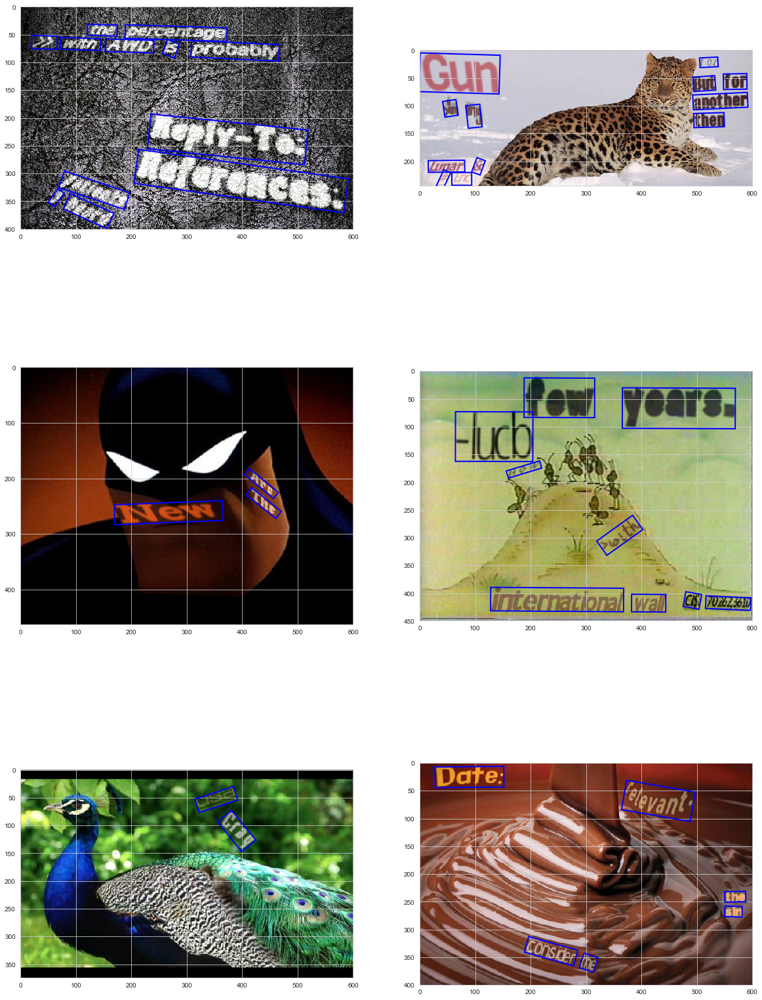

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [170]:
show_images_with_bounding_box(sample_data['imname'].tolist(), sample_data['wordBB'].tolist())

**Check distributions of bounding box counts**

In [171]:
bbox_counts = [bbox.shape[-1] for bbox in synth_data['wordBB']]

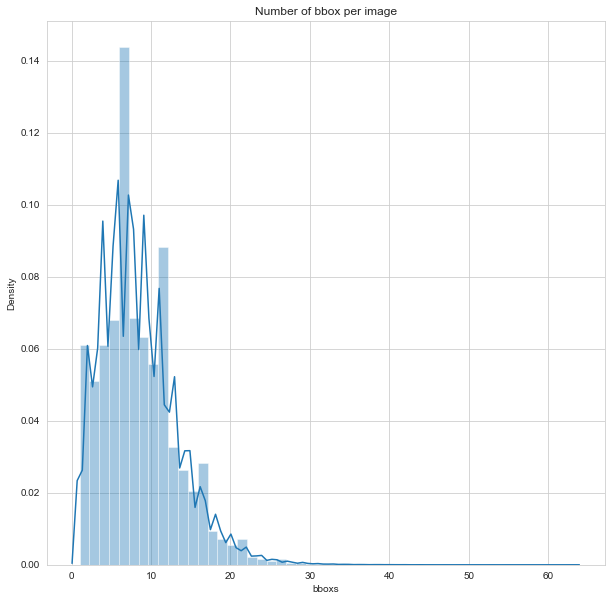

In [172]:
#PDF for bounding box counts
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_counts)
plt.title("Number of bbox per image")
plt.xlabel('bboxs')
plt.ylabel("Density")
plt.show()

Most of the images has less than 20 boxes and average of 5 to 6 boxes are there.

**Check distributions of bounding box height, width and size**

In [213]:
def getImgBBoxHeightWidthArea(img_bbox):

    def point_distance(p1, p2):
            p1, p2 = np.array(p1), np.array(p2)
            return np.sqrt(np.sum((p1-p2)**2))
        
    bbox_width=[] 
    bbox_height=[] 
    bbox_size=[]
    
    for j in range(img_bbox.shape[-1]):
        top_left = (img_bbox[0][0][j], img_bbox[1][0][j])
        top_right = (img_bbox[0][1][j], img_bbox[1][1][j])
        bottom_right = (img_bbox[0][2][j], img_bbox[1][2][j])

        width = point_distance(top_left, top_right)
        height = point_distance(top_right, bottom_right)
        size = height * width

        bbox_width.append(width)
        bbox_height.append(height)
        bbox_size.append(size)
   
    return bbox_width, bbox_height, bbox_size

In [214]:
def getBBoxHeightWidthArea(bboxes):
        
    bbox_width=[] 
    bbox_height=[] 
    bbox_size=[]

    for i in (range(len(bboxes))):
        widths, heights, sizes = getImgBBoxHeightWidthArea(bboxes[i])
        
        bbox_width.extend(widths)
        bbox_height.extend(heights)
        bbox_size.extend(sizes)
        
    return bbox_width, bbox_height, bbox_size

In [175]:
widths, heights, sizes = getBBoxHeightWidthArea(data['wordBB'])

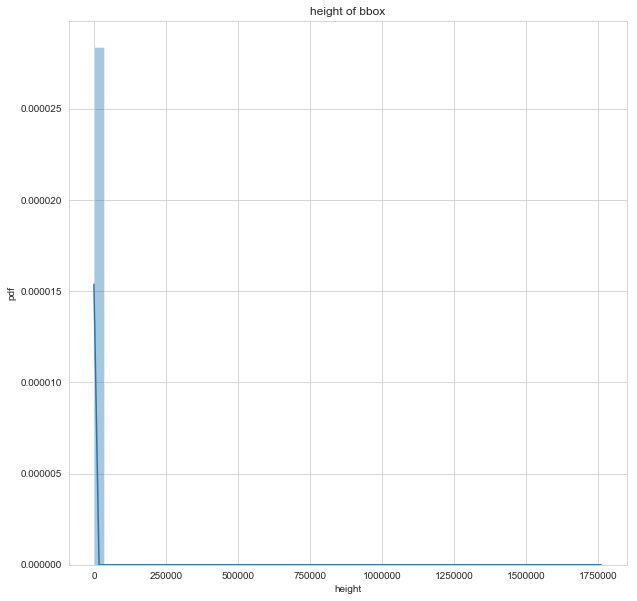

In [176]:
#PDF for bounding box height
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(heights)
plt.title("height of bbox")
plt.xlabel("height")
plt.ylabel("pdf")
plt.show()

In [177]:
for i in range(10,101,10):
    print('{}th percentile: {} '.format(i, np.percentile(heights, i)))

10th percentile: 13.937559127807617 
20th percentile: 16.432767868041992 
30th percentile: 18.518874168395996 
40th percentile: 20.568729400634766 
50th percentile: 22.807527542114258 
60th percentile: 25.480363845825195 
70th percentile: 29.04067897796631 
80th percentile: 34.443294525146484 
90th percentile: 45.027299880981445 
100th percentile: 1761191.125 


In [178]:
for i in range(90,101):
    print('{}th percentile: {} '.format(i, np.percentile(heights, i)))

90th percentile: 45.027299880981445 
91th percentile: 46.78985862731936 
92th percentile: 48.80891494750978 
93th percentile: 51.150881195068365 
94th percentile: 53.9131477355957 
95th percentile: 57.28870868682861 
96th percentile: 61.53394317626951 
97th percentile: 67.13070907592773 
98th percentile: 75.136483001709 
99th percentile: 88.74469261169422 
100th percentile: 1761191.125 


In [179]:
new_heights = [i for i in filter(lambda h: h <= 90,heights)]

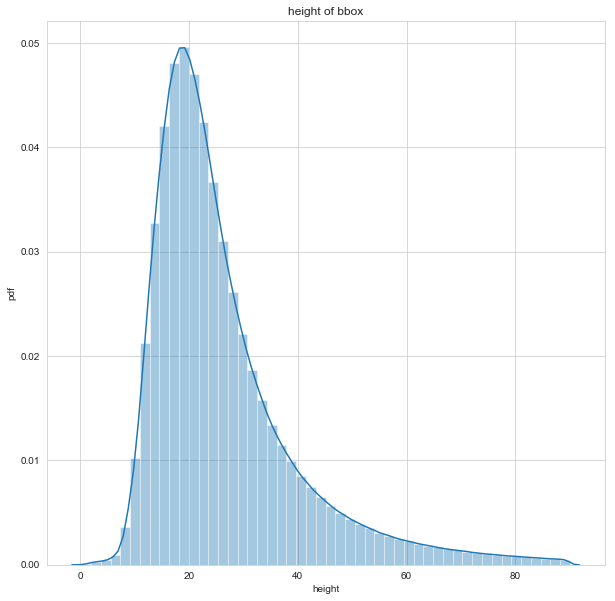

In [180]:
#PDF for bounding box height
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(new_heights)
plt.title("height of bbox")
plt.xlabel("height")
plt.ylabel("pdf")
plt.show()

From plot and percentile values, we can see most of the bounding box heights are in between 5 to 60.

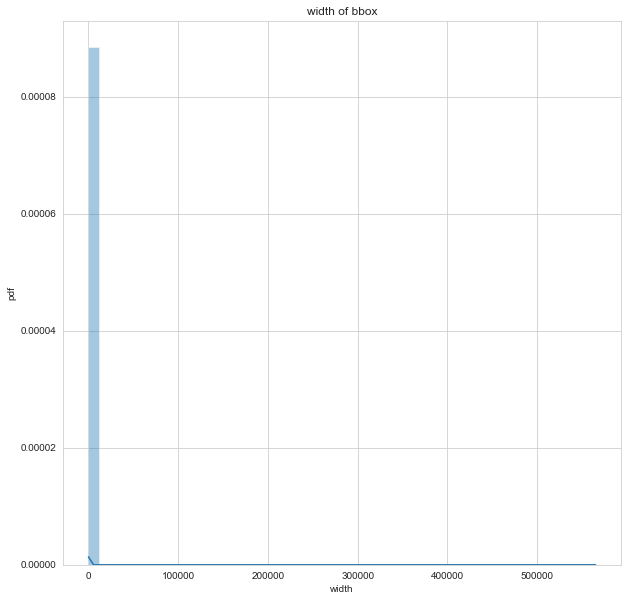

In [181]:
#PDF for bounding box width
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(widths)
plt.title("width of bbox")
plt.xlabel("width")
plt.ylabel("pdf")
plt.show()

In [182]:
for i in range(10,101,10):
    print('{}th percentile: {} '.format(i, np.percentile(widths, i)))

10th percentile: 27.57141876220703 
20th percentile: 37.565391540527344 
30th percentile: 45.18838691711426 
40th percentile: 52.53985595703125 
50th percentile: 60.52815818786621 
60th percentile: 69.9738540649414 
70th percentile: 82.20906066894531 
80th percentile: 100.33915710449219 
90th percentile: 134.68097686767578 
100th percentile: 565281.9375 


In [183]:
for i in range(90,101):
    print('{}th percentile: {} '.format(i, np.percentile(widths, i)))

90th percentile: 134.68097686767578 
91th percentile: 140.301880645752 
92th percentile: 146.74056091308603 
93th percentile: 154.19694213867194 
94th percentile: 162.99508819580078 
95th percentile: 173.69926834106445 
96th percentile: 187.19520874023405 
97th percentile: 205.22726516723634 
98th percentile: 230.78206481933603 
99th percentile: 274.28589782714755 
100th percentile: 565281.9375 


In [184]:
new_widths = [i for i in filter(lambda h: h <= 280,widths)]

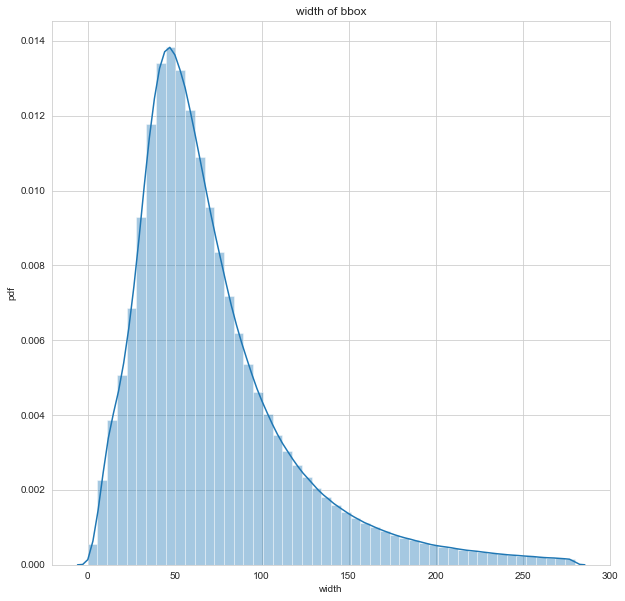

In [185]:
#PDF for bounding box width
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(new_widths)
plt.title("width of bbox")
plt.xlabel("width")
plt.ylabel("pdf")
plt.show()

From plot and percentile values, we can see most of the bounding box widths are in between 0 to 150.

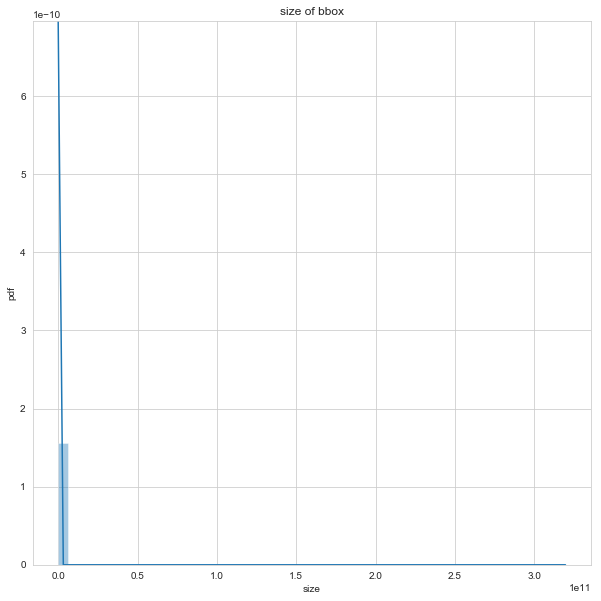

In [186]:
#PDF for bounding box size
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(sizes)
plt.title("size of bbox")
plt.xlabel("size")
plt.ylabel("pdf")
plt.show()

In [187]:
for i in range(10,101,10):
    print('{}th percentile: {} '.format(i, np.percentile(sizes, i)))

10th percentile: 478.1201477050781 
20th percentile: 677.1254272460938 
30th percentile: 865.8705444335938 
40th percentile: 1074.5408935546875 
50th percentile: 1327.6345825195312 
60th percentile: 1663.514404296875 
70th percentile: 2159.9713134765625 
80th percentile: 3020.0341796875 
90th percentile: 5103.66455078125 
100th percentile: 319562416128.0 


In [188]:
for i in range(90,101):
    print('{}th percentile: {} '.format(i, np.percentile(sizes, i)))

90th percentile: 5103.66455078125 
91th percentile: 5505.033764648438 
92th percentile: 5983.837109375001 
93th percentile: 6570.463061523438 
94th percentile: 7305.667236328115 
95th percentile: 8253.204833984375 
96th percentile: 9532.8095703125 
97th percentile: 11350.390771484372 
98th percentile: 14243.720898437517 
99th percentile: 19735.44970703124 
100th percentile: 319562416128.0 


In [189]:
new_sizes = [i for i in filter(lambda h: h <= 20000,sizes)]

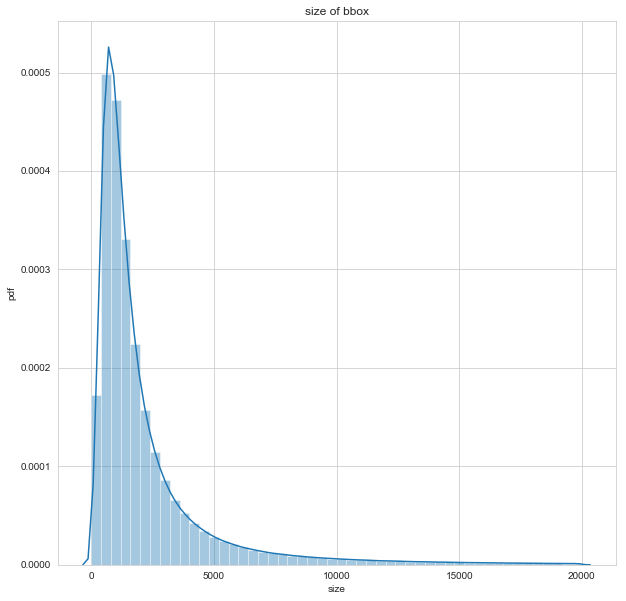

In [190]:
#PDF for bounding box size
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(new_sizes)
plt.title("size of bbox")
plt.xlabel("size")
plt.ylabel("pdf")
plt.show()

From plot and percentile values, we can see most of the bounding box sizes are in between 0 to 5000. 

There were some outliers. While generating ground truth for images, we need to check for outliers in bounding boxes.

In [191]:
def getAverageBBoxHeightWidthSize(img_bbox):
    widths, heights, sizes = getImgBBoxHeightWidthArea(img_bbox)
    avg_width = int(mean(widths))
    avg_height = int(mean(heights))
    avg_size = int(mean(sizes))
    return avg_width, avg_height, avg_size

In [240]:
synth_data = pd.read_pickle('synth_data.pkl')
synth_data.head()

,imname,wordBB,txt
0,SynthText/8/ballet_106_0.jpg,"[[[420.58957, 418.85016, 448.08478, 410.3094, ...","[Lines:\nI lost\nKevin , will ,..."
1,SynthText/8/ballet_106_1.jpg,"[[[255.28821, 424.29144, 419.3614, 416.88367, ...","[with , Sender:\nBNR-..."
2,SynthText/8/ballet_106_10.jpg,"[[[322.5814, 432.39447, 163.69196, 125.584595,...","[Fern , Mutch,, void , his , loony , it's ..."
3,SynthText/8/ballet_106_100.jpg,"[[[257.37372, 428.30585, 422.95227, 79.92147, ...","[Re: , reins\nneck , War\nfor\nthe, new..."
4,SynthText/8/ballet_106_101.jpg,"[[[252.09306, 253.62775, 91.88652, 299.4024, 4...","[ Scott \nSender:, use , between ..."


In [241]:
synth_data[['avg_w', 'avg_h', 'avg_s']] = synth_data['wordBB'].map(getAverageBBoxHeightWidthSize).apply(pd.Series)

In [242]:
synth_data.head()

,imname,wordBB,txt,avg_w,avg_h,avg_s
0,SynthText/8/ballet_106_0.jpg,"[[[420.58957, 418.85016, 448.08478, 410.3094, ...","[Lines:\nI lost\nKevin , will ,...",55,26,1486
1,SynthText/8/ballet_106_1.jpg,"[[[255.28821, 424.29144, 419.3614, 416.88367, ...","[with , Sender:\nBNR-...",80,26,2133
2,SynthText/8/ballet_106_10.jpg,"[[[322.5814, 432.39447, 163.69196, 125.584595,...","[Fern , Mutch,, void , his , loony , it's ...",65,36,2500
3,SynthText/8/ballet_106_100.jpg,"[[[257.37372, 428.30585, 422.95227, 79.92147, ...","[Re: , reins\nneck , War\nfor\nthe, new...",78,25,2121
4,SynthText/8/ballet_106_101.jpg,"[[[252.09306, 253.62775, 91.88652, 299.4024, 4...","[ Scott \nSender:, use , between ...",74,31,2846


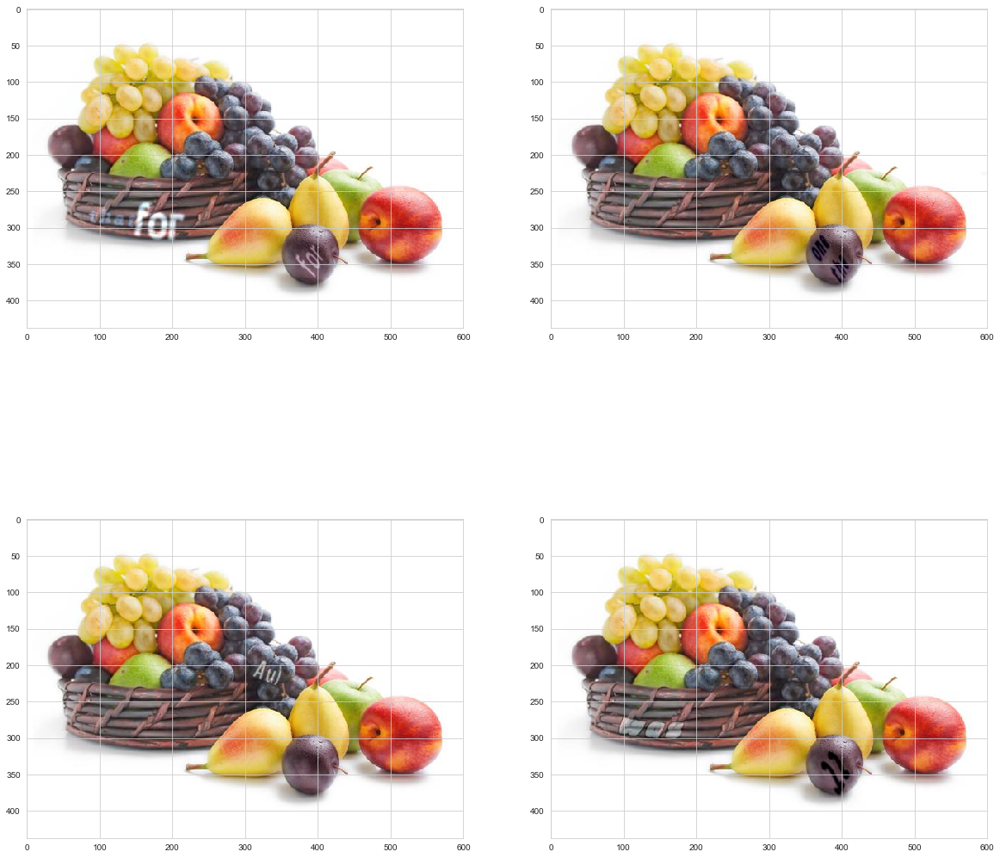

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [243]:
# Show images with large heights
show_images(synth_data[synth_data['avg_h'] > 9000]['imname'].tolist()[:4])

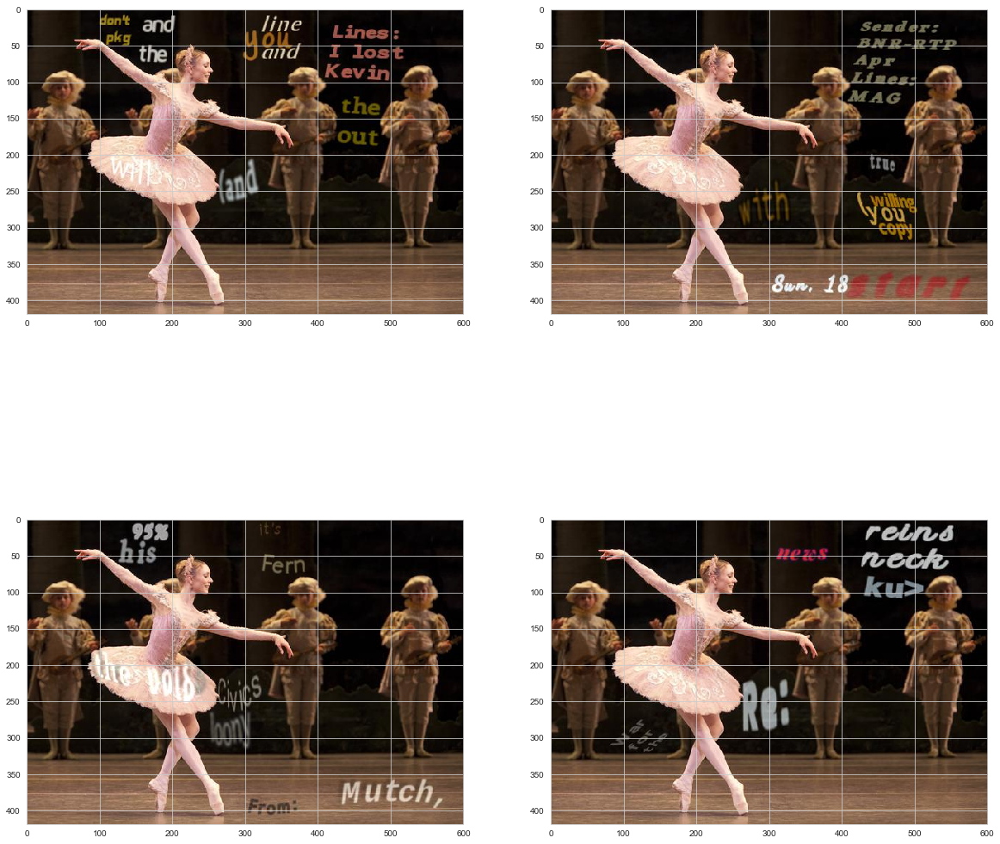

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [244]:
# Show images with normal heights
show_images(synth_data[synth_data['avg_h'] < 40]['imname'].tolist()[:4])

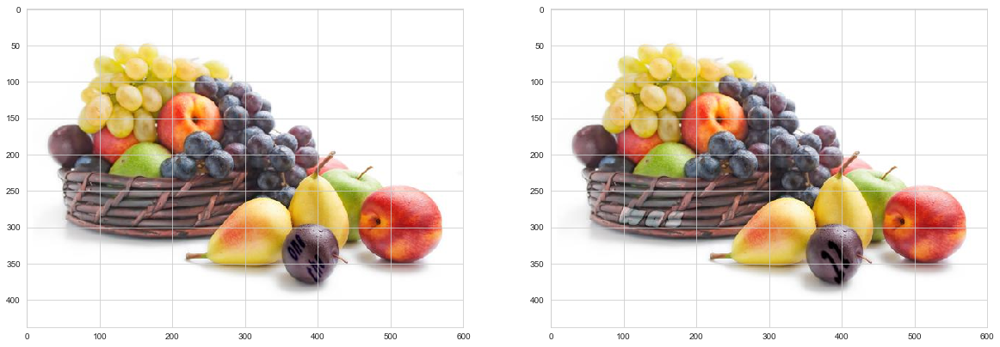

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [245]:
# Show images with large widths
show_images(synth_data[synth_data['avg_w'] > 50000]['imname'].tolist())

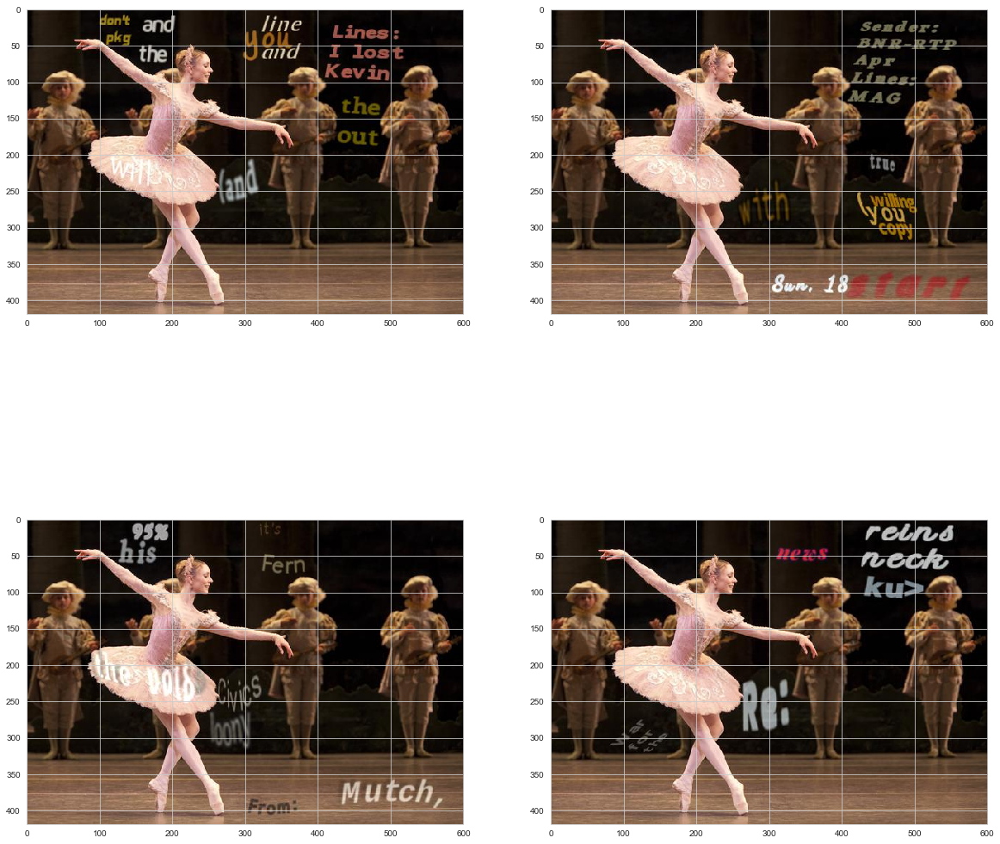

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [246]:
# Show images with normal widths
show_images(synth_data[synth_data['avg_w'] < 150]['imname'].tolist()[:4])

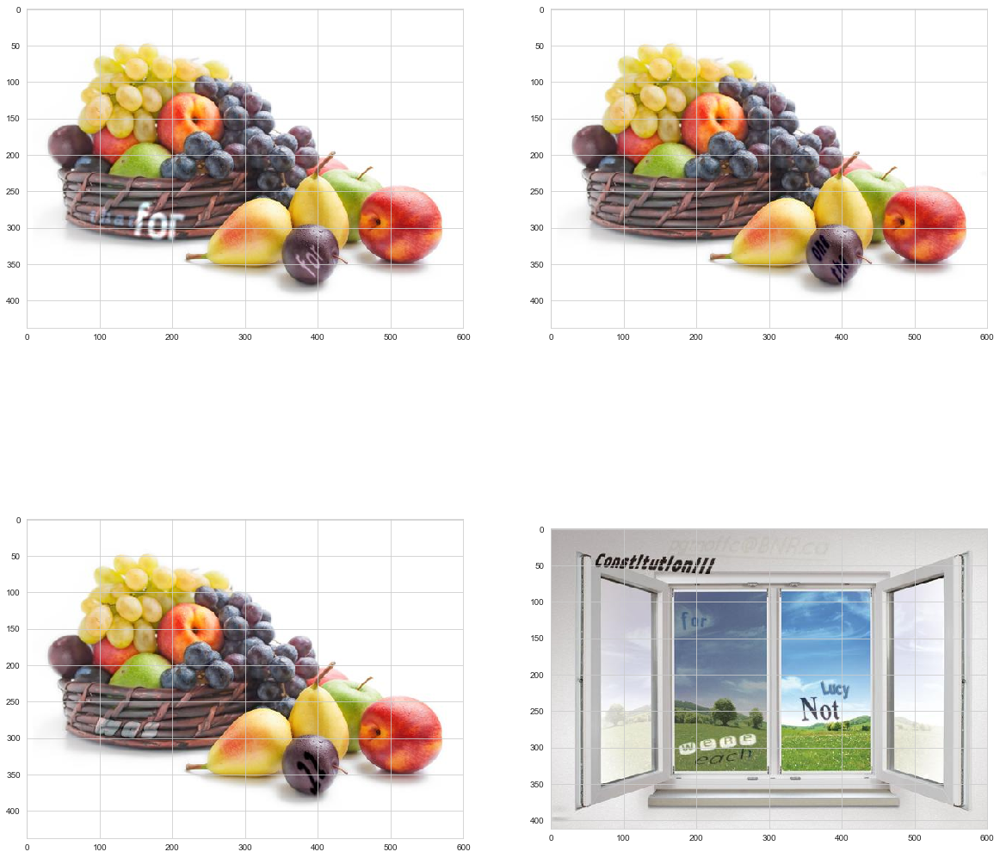

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [247]:
# Show images with large sizes
show_images(synth_data[synth_data['avg_s'] > 310000000]['imname'].tolist())

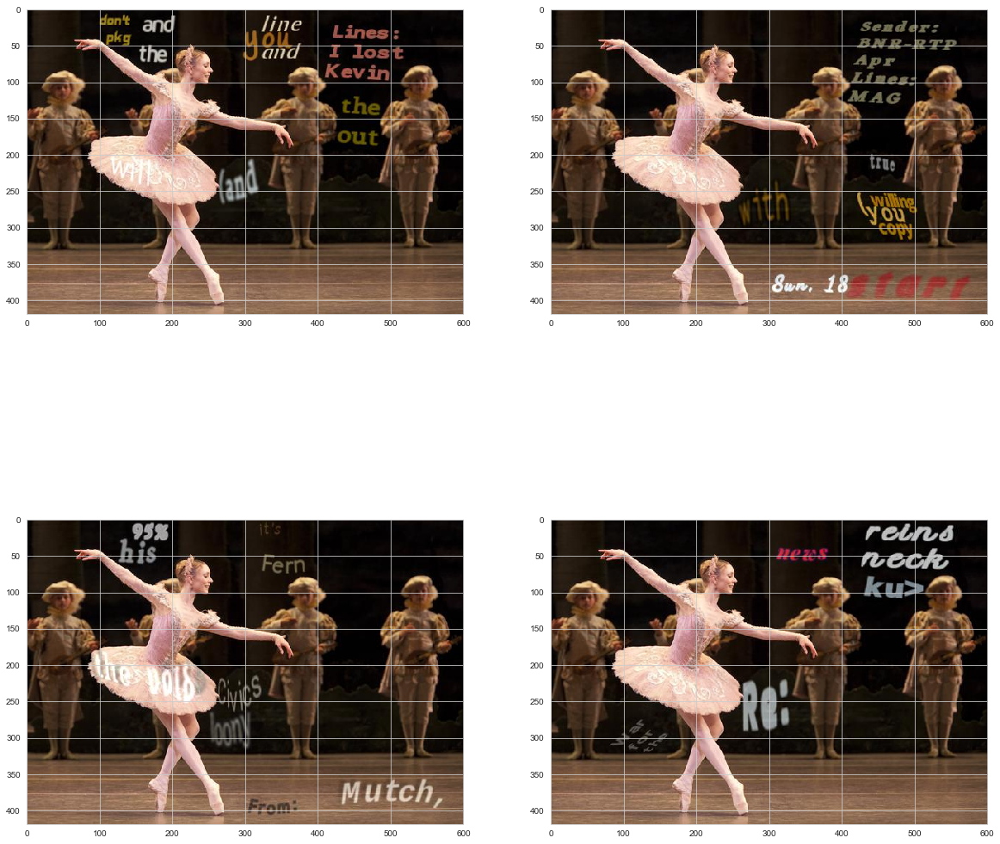

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [248]:
# Show images with normal sizes
show_images(synth_data[synth_data['avg_s'] < 6000]['imname'].tolist()[:4])

As we can see the boundary boxes are not too big or obnormal, but they look similar to others. The values differ because of the image sizes or small large texts. But during modeling as we are resizing all the images to same size, it wont be any issue. From pictures, there are no outlier bounding boxes.

### Extract sample images for training

As we can see Synth has huge number of images in different folders and we cant use all of them in training. So we will keep all the files which are available in gt.mat and discard others. If still we have large amount of images, we can use only a sample of it.

In [3]:
synth_data = pd.read_pickle('synth_data.pkl')
synth_data.head()

,imname,wordBB,txt
0,SynthText/8/ballet_106_0.jpg,"[[[420.58957, 418.85016, 448.08478, 410.3094, ...","[Lines:\nI lost\nKevin , will ,..."
1,SynthText/8/ballet_106_1.jpg,"[[[255.28821, 424.29144, 419.3614, 416.88367, ...","[with , Sender:\nBNR-..."
2,SynthText/8/ballet_106_10.jpg,"[[[322.5814, 432.39447, 163.69196, 125.584595,...","[Fern , Mutch,, void , his , loony , it's ..."
3,SynthText/8/ballet_106_100.jpg,"[[[257.37372, 428.30585, 422.95227, 79.92147, ...","[Re: , reins\nneck , War\nfor\nthe, new..."
4,SynthText/8/ballet_106_101.jpg,"[[[252.09306, 253.62775, 91.88652, 299.4024, 4...","[ Scott \nSender:, use , between ..."


In [58]:
def createNewSynthDataSet(paths, root = 'SampleSynth'):
    if not os.path.exists(root):
        os.mkdir(root)
    for path in paths:
        if os.path.exists(path):
            path_list = path.split('/')[1:]
            newPath = root + '/' + path_list[0]
            if not os.path.exists(newPath):
                os.mkdir(newPath)    
            newPath += '/' + path_list[1]
            if not os.path.exists(newPath):
                shutil.move(path, newPath)

In [59]:
createNewSynthDataSet(synth_data['imname'])

In [3]:
# Check image counts
def getFileCounts(root = 'SampleSynth'):
    count = 0
    for _, _, files in os.walk(root,topdown=True):
        for file in files:
            count += 1
    return count        

In [61]:
getFileCounts() == synth_data.shape[0]

True

As there are still huge number of data, we can take only 20% of it. Rather than chossing specific folders, we can use all the folders with less images in it. So we can remove 80% of images from each folder.

In [97]:
def removeImagesWithSampling(root = 'SampleSynth', per_delete = 0.8):
    for folder in os.listdir(root):
        path = root + '/' + folder
        files = []
        for file in os.listdir(path):
            files.append(path + '/' + file)
        deleteCount = int(len(files) * per_delete)
        random.shuffle(files)
        files = files[:deleteCount]
        for file in files:
            if os.path.exists(file):
                os.remove(file)

In [95]:
removeImagesWithSampling()

In [96]:
actual_count = getFileCounts()
required_count = sample_size = synth_data.shape[0] * 0.2
print(required_count)
print(actual_count)

171750.0
171829


We have retained 20% of data from SampleSynth. Its 170k approxmately. We need to get reduced to 10k. We can follow the same process.

In [99]:
removeImagesWithSampling(per_delete = 0.94)

In [47]:
print('file count:', getFileCounts())

file count: 10417


### Update the synth gt file

After that we have manually placed the gt file inside SampleSynth. But this file contains data for all the images. So we need to keep only the gt data related to sampled images. 

In [2]:
# Get the gt file

synth_bbox_txt_info = scipy.io.loadmat('SampleSynth/gt.mat')
synth_gt_dict = dict()

imnames = ['SampleSynth/' + synth_bbox_txt_info['imnames'][0][i][0] for i in range(synth_bbox_txt_info['imnames'][0].shape[0])]
synth_gt_dict['imname'] = imnames

bboxes = [synth_bbox_txt_info['wordBB'][0][i] if synth_bbox_txt_info['wordBB'][0][i].ndim == 3 
          else np.expand_dims(synth_bbox_txt_info['wordBB'][0][i], axis=-1)
          for i in range(synth_bbox_txt_info['wordBB'][0].shape[0])]
synth_gt_dict['wordBB'] = bboxes

txts = [synth_bbox_txt_info['txt'][0][i] for i in range(synth_bbox_txt_info['txt'][0].shape[0])]
synth_gt_dict['txt'] = txts

In [3]:
print('Total number of items: ', len(synth_gt_dict['imname']))

Total number of items:  858750


In [4]:
print('Sample image path:', synth_gt_dict['imname'][0])

Sample image path: SampleSynth/8/ballet_106_0.jpg


In [5]:
def extractSampleSynthGT(root = 'SampleSynth', dt = dict()):
    # Proceed if dt is not empty
    sample_dict = dict()
    sample_dict['imname'] = []
    sample_dict['wordBB'] = []
    sample_dict['txt'] = []
    if dt:
        print('Total data count: ', len(dt['imname']))
        for folder in os.listdir(root):
            if folder != 'gt.mat':
                path = root + '/' + folder
                for file in os.listdir(path):
                    filePath = path + '/' + file
                    index = dt['imname'].index(filePath) if filePath in dt['imname'] else None
                    if index is not None:
                        sample_dict['imname'].append(filePath)
                        sample_dict['wordBB'].append(dt['wordBB'][index])
                        sample_dict['txt'].append(dt['txt'][index])
         
        print('Sampled data count: ', len(sample_dict['imname']))
    return sample_dict   

In [6]:
sampleSynth_gt = extractSampleSynthGT(dt = synth_gt_dict)

Total data count:  858750
Sampled data count:  10416


In [11]:
print(sampleSynth_gt['imname'][0])
print('-------------------------')
print(sampleSynth_gt['wordBB'][0])
print('-------------------------')
print(sampleSynth_gt['txt'][0])

SampleSynth/1/ant+hill_100_103.jpg
-------------------------
[[[328.48514  164.05005  373.5725   187.81161  317.94943  473.42017
   214.00537  322.349    369.397    462.57764  303.59027   96.01561 ]
  [412.7028   357.68347  503.03308  299.34134  460.60434  500.34033
   298.30066  351.46527  445.16318  528.19995  362.38812  472.2019  ]
  [412.74222  357.54822  502.55865  299.62976  460.88028  500.54266
   298.71472  351.8681   443.96347  528.52936  357.95605  482.72168 ]
  [328.52457  163.9148   373.09808  188.10004  318.22537  473.6225
   214.41943  322.75183  368.1973   462.90704  299.1582   106.535385]]

 [[ 17.724215  40.648216  36.650272  64.8541    63.053185  61.52821
    93.27238   90.8537    87.18014   87.723206 138.20905  312.89697 ]
  [ 17.425207  42.359276  40.641575  62.74485   60.355293  61.1139
    91.05833   90.08894   92.48438   86.25824  146.63104  266.95648 ]
  [ 28.534575  57.662025  56.030415  77.99586   74.9463    74.26233
   106.82252  105.42641  109.62116  101.012

In [19]:
pkl = open('SampleSynth/synth_gt.txt', 'wb')
pickle.dump(sampleSynth_gt, pkl)
pkl.close()

In [20]:
with open('SampleSynth/synth_gt.txt', 'rb') as f:
    data = f.read()
synth_gt = pickle.loads(data)

print(synth_gt.keys())
print(synth_gt['imname'][0])

dict_keys(['imname', 'wordBB', 'txt'])
SampleSynth/1/ant+hill_100_103.jpg


In [22]:
os.remove('SampleSynth/gt.mat')

We can use the new gt file in data generator.

### EDA for ICDAR 15 dataset images

This dataset contains real world image data. Its comaparatively very less than the previous dataset.

In [198]:
def getFilePathICDAR(root):
    """This function takes a root directory as input and gives all the file paths"""
    files = []
    for f in os.listdir(root):
        files.append(root + '/' + f)
    return files    

In [199]:
# Get the image paths
img_paths = getFilePathICDAR('ch4_training_images')
print('Number of ICDAR images: ', len(img_paths))

Number of ICDAR images:  1000


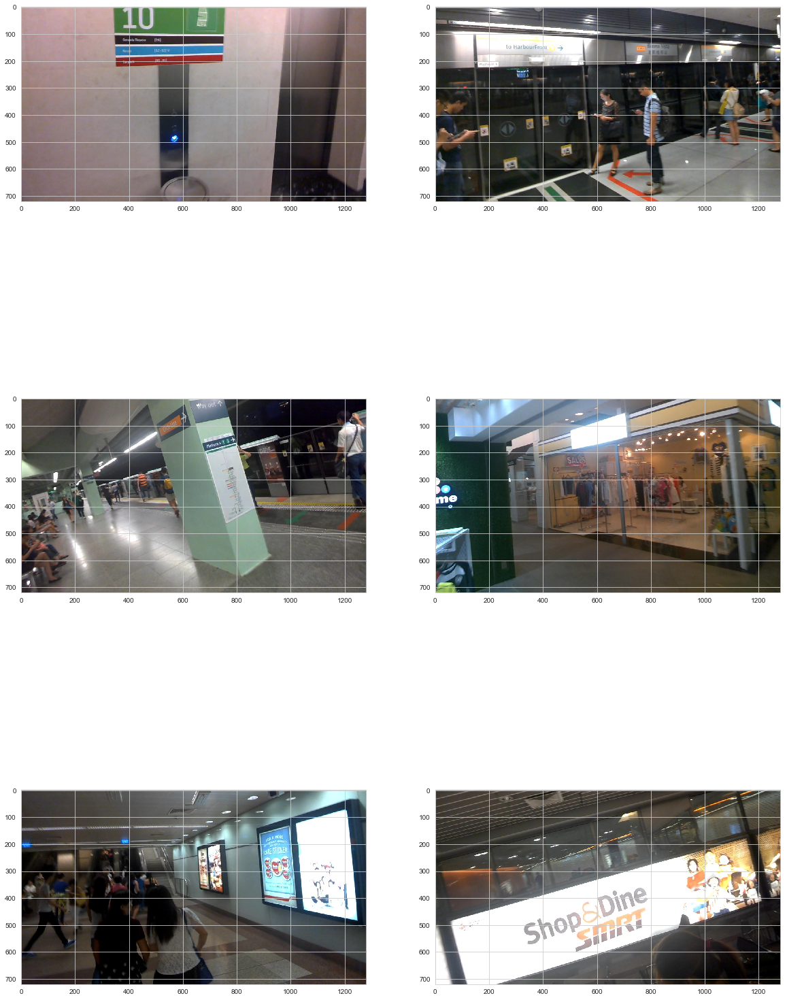

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [200]:
# Show images
show_images(img_paths[:6])

In [201]:
img_df = pd.DataFrame(getImageShape(img_paths), columns =['Height', 'Width'])
img_df.head()

,Height,Width
0,1280,720
1,1280,720
2,1280,720
3,1280,720
4,1280,720


In [202]:
img_df.value_counts()

Height  Width
1280    720      1000
dtype: int64

As we can see all the images have fixes height and width (1280, 720)

### EDA for ICDAR1 dataset bounding boxes

Here we have a folder for the bounding box information. For each image, one file is dedicated to it.

The text looks like below,

377,117,463,117,465,130,378,130,Genaxis Theatre

Here 1st 8 values represents x1,y1,x2,y2,x3,y3,x4,y4 and the last one represents the text within it.

In cases, we can see '###' instead of real texts. It represents 'Dont care', its because there can be some texts which are not properly visible to process or not much useful to detect.

In [203]:
file_paths = getFilePathICDAR('ch4_training_localization_transcription_gt')
print('Total files: ', len(file_paths))

Total files:  1000


In [204]:
# Sample file path:
file_paths[0]

'ch4_training_localization_transcription_gt/gt_img_1.txt'

In [205]:
# Sample image path:
img_paths[0]

'ch4_training_images/img_1.jpg'

In [216]:
def getGT(file_path):
    """For a given file path, it will return set of bounding box cordinates and text label"""
    
    with open(file_path, 'r', encoding='utf-8-sig') as f:
        # Split the lines for each bouning box
        lines = f.read().split('\n')
        # get bounidng box cordinates
        bbox_cord = [line.split(',')[:8] for line in lines if line]
        # Extract text
        texts = [''.join(line.split(',')[8:]) for line in lines if line]
    
        # As in Synth dataset the cordinates are with shape (2,4,count)
        # 2-> For x and y values
        # 4-> cordinate values for 4 vertices
        #count-> Number of bouning boxes
        
        # convert the notation similar to Synth
        bbox_cord = np.array(bbox_cord, dtype = 'int32')

        x1, x2, x3, x4 = bbox_cord[:,0], bbox_cord[:,2], bbox_cord[:,4], bbox_cord[:,6]
        y1, y2, y3, y4 = bbox_cord[:,1], bbox_cord[:,3], bbox_cord[:,5], bbox_cord[:,7]
        
        x = np.array([x1,x2,x3,x4])
        y = np.array([y1,y2,y3,y4])
        
        return np.array([x,y]), texts

In [217]:
icdar_data = pd.DataFrame(list(zip(img_paths,file_paths)),columns=["imname",'fpath'])
icdar_data.head()

,imname,fpath
0,ch4_training_images/img_1.jpg,ch4_training_localization_transcription_gt/gt_...
1,ch4_training_images/img_10.jpg,ch4_training_localization_transcription_gt/gt_...
2,ch4_training_images/img_100.jpg,ch4_training_localization_transcription_gt/gt_...
3,ch4_training_images/img_1000.jpg,ch4_training_localization_transcription_gt/gt_...
4,ch4_training_images/img_101.jpg,ch4_training_localization_transcription_gt/gt_...


In [218]:
print(icdar_data.loc[0,'imname'])
print(icdar_data.loc[0,'fpath'])

ch4_training_images/img_1.jpg
ch4_training_localization_transcription_gt/gt_img_1.txt


In [219]:
icdar_data[['wordBB', 'txt']] = icdar_data['fpath'].map(getGT).apply(pd.Series)

In [220]:
icdar_data.drop(columns = ['fpath'], axis=1, inplace=True)
icdar_data.head()

,imname,wordBB,txt
0,ch4_training_images/img_1.jpg,"[[[377, 493, 374, 492, 376, 494, 374], [463, 5...","[Genaxis Theatre, [06], ###, 62-03, Carpark, #..."
1,ch4_training_images/img_10.jpg,"[[[261, 288, 743, 783, 831, 159, 785, 1011], [...","[###, HarbourFront, CC22, bua, ###, ###, ###, ..."
2,ch4_training_images/img_100.jpg,"[[[645, 689, 519, 549, 684, 730, 744, 759], [6...","[Way, out, ###, Line, Platform, ###, ###, ###]"
3,ch4_training_images/img_1000.jpg,"[[[486, 1, 48, 264], [554, 86, 62, 287], [558,...","[###, ###, ###, ###]"
4,ch4_training_images/img_101.jpg,"[[[899, 931, 905, 928, 939, 892, 946, 919, 933...","[CARE, STICKER, FOR, ###, MORE, ###, ###, ###,..."


In [221]:
icdar_data.to_pickle('icdar_data.pkl')

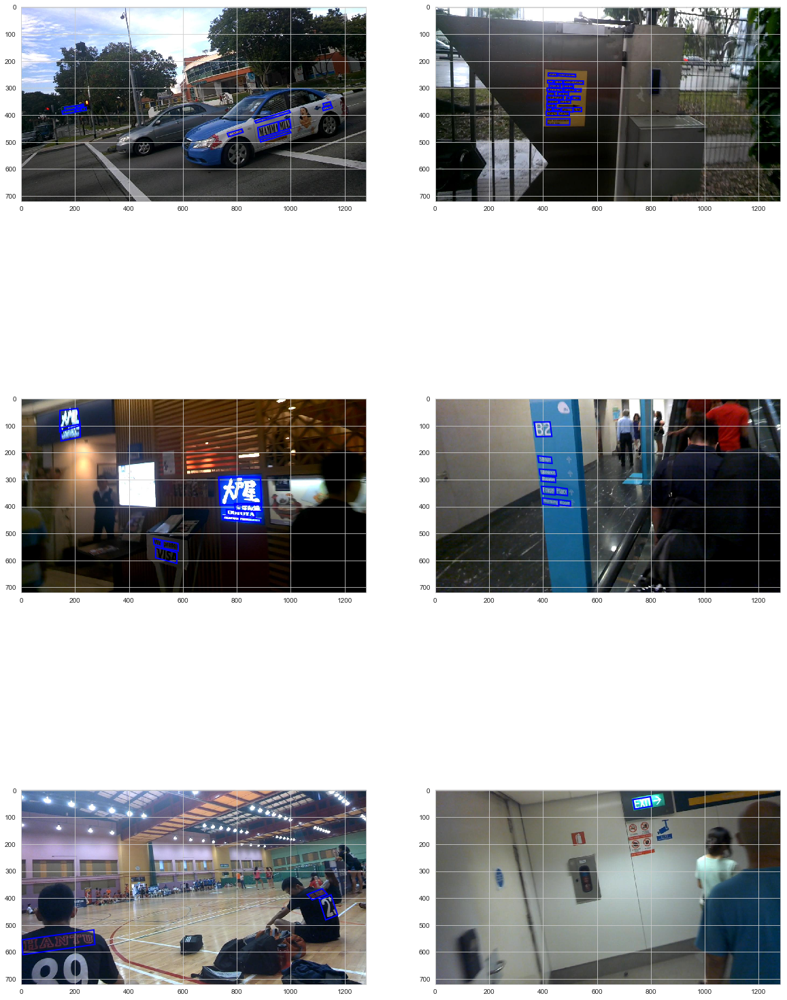

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [222]:
# Some images with bouning box
show_images_with_bounding_box(icdar_data['imname'][10:16].tolist(), icdar_data['wordBB'][10:16].tolist())

In [223]:
# Getiing height, width and size of bounding boxes
widths, heights, sizes = getBBoxHeightWidthArea(icdar_data['wordBB'])

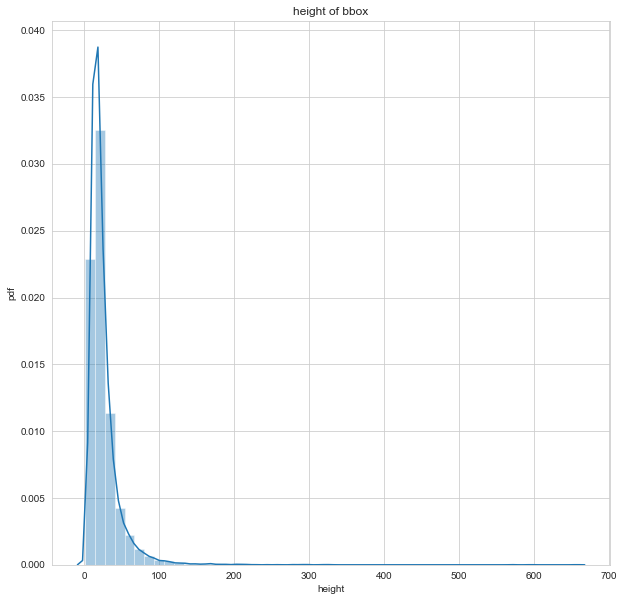

In [224]:
#PDF for bounding box height
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(heights)
plt.title("height of bbox")
plt.xlabel("height")
plt.ylabel("pdf")
plt.show()

In [225]:
for i in range(90,101):
    print('{}th percentile: {} '.format(i, np.percentile(heights, i)))

90th percentile: 44.682194060547616 
91th percentile: 47.01063709417264 
92th percentile: 49.8196748283246 
93th percentile: 53.03772242470448 
94th percentile: 56.2147616077814 
95th percentile: 60.166435825965294 
96th percentile: 66.06814663663572 
97th percentile: 74.06078584514209 
98th percentile: 84.62551540792713 
99th percentile: 108.41789177640831 
100th percentile: 657.0760990935524 


Most of the heights are in between 0 to 100.

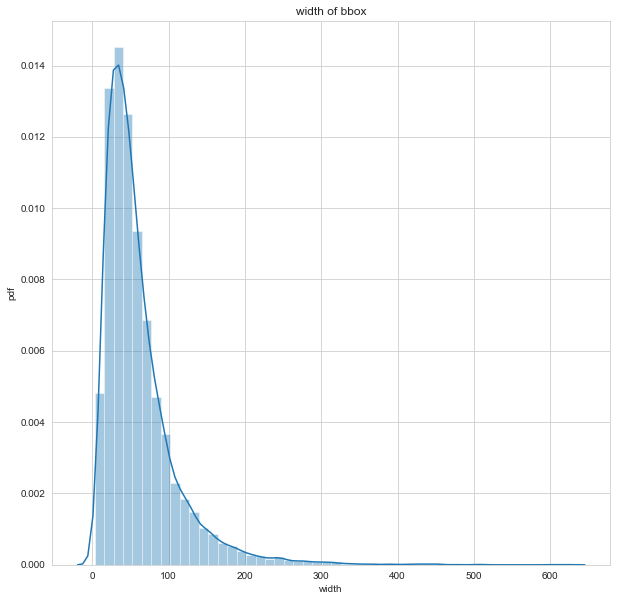

In [226]:
#PDF for bounding box width
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(widths)
plt.title("width of bbox")
plt.xlabel("width")
plt.ylabel("pdf")
plt.show()

In [227]:
for i in range(90,101):
    print('{}th percentile: {} '.format(i, np.percentile(widths, i)))

90th percentile: 116.70903992407786 
91th percentile: 121.80722474467595 
92th percentile: 127.49587576596306 
93th percentile: 133.30416347586447 
94th percentile: 142.1977493801249 
95th percentile: 152.00328943809077 
96th percentile: 164.00304875214974 
97th percentile: 180.34685421776192 
98th percentile: 205.00975586542216 
99th percentile: 248.08702729601495 
100th percentile: 622.8523099419316 


Except few widths, all are within 0-200.

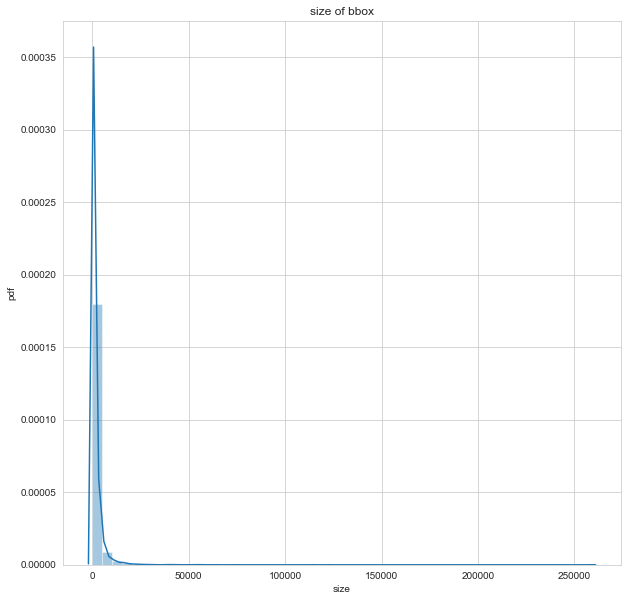

In [228]:
#PDF for bounding box size
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(sizes)
plt.title("size of bbox")
plt.xlabel("size")
plt.ylabel("pdf")
plt.show()

In [229]:
for i in range(90,101):
    print('{}th percentile: {} '.format(i, np.percentile(widths, i)))

90th percentile: 116.70903992407786 
91th percentile: 121.80722474467595 
92th percentile: 127.49587576596306 
93th percentile: 133.30416347586447 
94th percentile: 142.1977493801249 
95th percentile: 152.00328943809077 
96th percentile: 164.00304875214974 
97th percentile: 180.34685421776192 
98th percentile: 205.00975586542216 
99th percentile: 248.08702729601495 
100th percentile: 622.8523099419316 


There are few sizes with extreme values, rest all lies in between 0-200.

In [231]:
# Check for outliers
icdar_data[['avg_w', 'avg_h', 'avg_s']] = icdar_data['wordBB'].map(getAverageBBoxHeightWidthSize).apply(pd.Series)
icdar_data.head()

,imname,wordBB,txt,avg_w,avg_h,avg_s
0,ch4_training_images/img_1.jpg,"[[[377, 493, 374, 492, 376, 494, 374], [463, 5...","[Genaxis Theatre, [06], ###, 62-03, Carpark, #...",59,25,2108
1,ch4_training_images/img_10.jpg,"[[[261, 288, 743, 783, 831, 159, 785, 1011], [...","[###, HarbourFront, CC22, bua, ###, ###, ###, ...",60,18,1131
2,ch4_training_images/img_100.jpg,"[[[645, 689, 519, 549, 684, 730, 744, 759], [6...","[Way, out, ###, Line, Platform, ###, ###, ###]",25,18,521
3,ch4_training_images/img_1000.jpg,"[[[486, 1, 48, 264], [554, 86, 62, 287], [558,...","[###, ###, ###, ###]",47,24,1383
4,ch4_training_images/img_101.jpg,"[[[899, 931, 905, 928, 939, 892, 946, 919, 933...","[CARE, STICKER, FOR, ###, MORE, ###, ###, ###,...",33,14,508


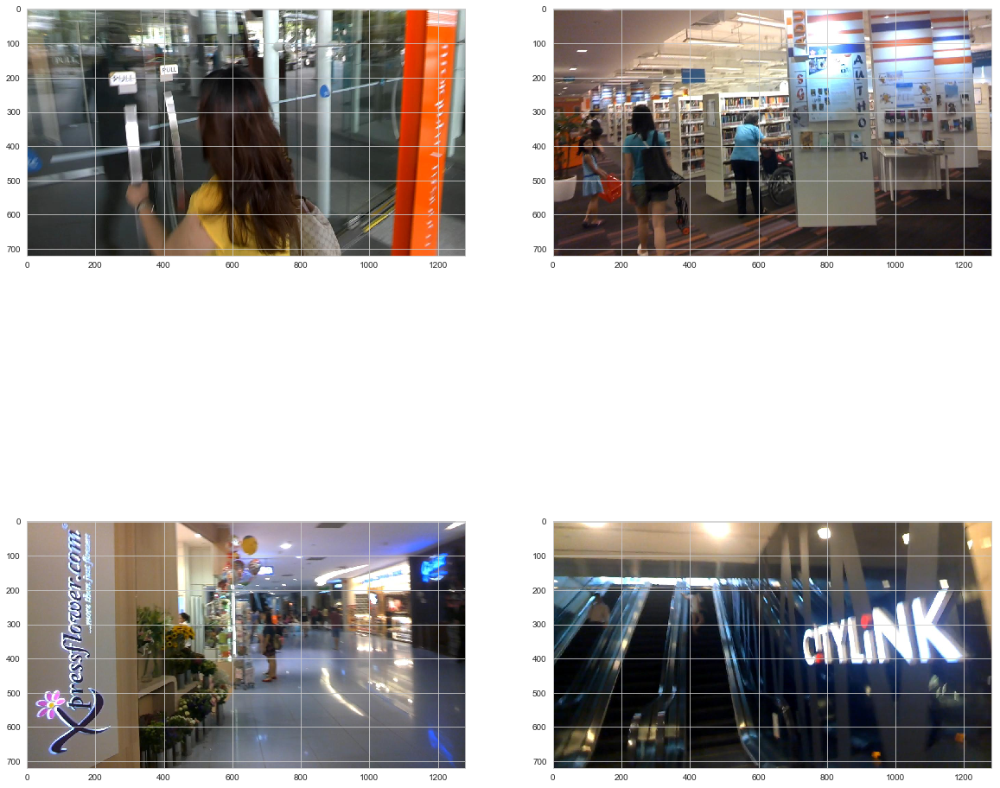

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [237]:
# Check images havig large bouning boxes/text
show_images(icdar_data[icdar_data['avg_h'] > 150]['imname'].tolist()[:4])

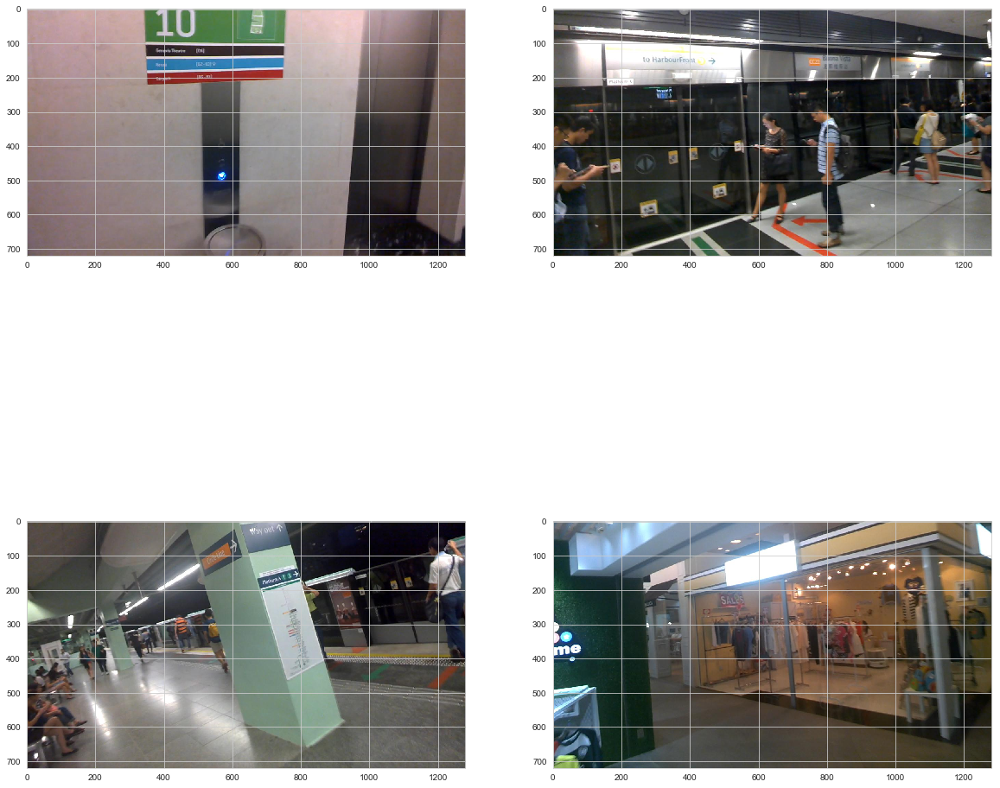

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [238]:
# Check images havig normal height bouning boxes/text
show_images(icdar_data[icdar_data['avg_h'] < 70]['imname'].tolist()[:4])

As we can see, the text area are differing in both of these cases resulting large height difference which seems outlier.

In [249]:
# Bounding box count
bbox_counts = [bbox.shape[-1] for bbox in icdar_data['wordBB']]

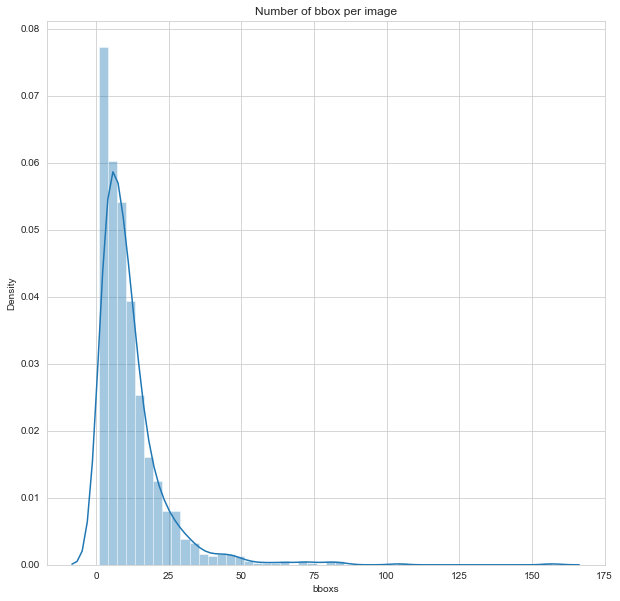

In [250]:
#PDF for bounding box counts
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_counts)
plt.title("Number of bbox per image")
plt.xlabel('bboxs')
plt.ylabel("Density")
plt.show()

As there are lots of tiny tiny texts and many text areas, we are seeing few large number of bounding boxes for some images.